##### Case Machine Learning
Essa base de dados é proveniente da empresa iFood, utilizada em uma processo seletivo já encerrado do ano de 2020.

In [1]:
# imporrtações
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import tabulate
from tabulate import tabulate
from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler,
    MinMaxScaler,
    PowerTransformer,
)
from sklearn.compose import ColumnTransformer
from matplotlib.colors import CenteredNorm, ListedColormap
from matplotlib.cm import ScalarMappable
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from sklearn.pipeline import Pipeline
from sklearn.cluster import KMeans
from matplotlib.ticker import PercentFormatter
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold
from imblearn.pipeline import Pipeline  
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import cross_validate
from pprint import pprint
from sklearn.metrics import RocCurveDisplay
from sklearn.model_selection import cross_val_predict
import numpy as np
from sklearn.model_selection import GridSearchCV

In [2]:
# verificando as versões das bibliotecas utilizadas

def get_library_versions():
    libraries = ['pandas', 'numpy', 'matplotlib', 'seaborn', 'tabulate']

    versions = []
    for lib in libraries:
        try:
            version = __import__(lib).__version__
            versions.append([lib, version])
        except ImportError:
            versions.append([lib, 'Não encontrado'])

    # Adiciona a versão do Python
    versions.append(['python', f'{sys.version_info.major}.{sys.version_info.minor}.{sys.version_info.micro}'])

    return versions

if __name__ == "__main__":
    versions = get_library_versions()

    # Imprime as versões como uma tabela
    headers = ['Biblioteca', 'Versão']
    print(tabulate(versions, headers, tablefmt='fancy_grid'))

╒══════════════╤══════════╕
│ Biblioteca   │ Versão   │
╞══════════════╪══════════╡
│ pandas       │ 1.5.3    │
├──────────────┼──────────┤
│ numpy        │ 1.24.3   │
├──────────────┼──────────┤
│ matplotlib   │ 3.7.1    │
├──────────────┼──────────┤
│ seaborn      │ 0.12.2   │
├──────────────┼──────────┤
│ tabulate     │ 0.8.10   │
├──────────────┼──────────┤
│ python       │ 3.11.4   │
╘══════════════╧══════════╛


In [3]:
df = pd.read_csv(r'c:/Users/carol/Downloads/ml_project1_data.csv')

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0


In [4]:
df.shape

(2240, 29)

In [5]:
# verificando o tipo dos dados
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

### Explicar o que cada coluna representa

In [6]:
# verificando se há dados nulos
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [7]:
# verificando se há dados em duplicidade
df.duplicated().sum()

0

In [8]:
with pd.option_context (
    'display.float_format','{:.2f}'.format,
    'display.max_columns', None,
):
    display(df.describe())

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.00,2240.00,2216.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00,2240.00
mean,5592.16,1968.81,52247.25,0.44,0.51,49.11,303.94,26.30,166.95,37.53,27.06,44.02,2.33,4.08,2.66,5.79,5.32,0.07,0.07,0.07,0.06,0.01,0.01,3.00,11.00,0.15
std,3246.66,11.98,25173.08,0.54,0.54,28.96,336.60,39.77,225.72,54.63,41.28,52.17,1.93,2.78,2.92,3.25,2.43,0.26,0.26,0.26,0.25,0.11,0.10,0.00,0.00,0.36
min,0.00,1893.00,1730.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,11.00,0.00
25%,2828.25,1959.00,35303.00,0.00,0.00,24.00,23.75,1.00,16.00,3.00,1.00,9.00,1.00,2.00,0.00,3.00,3.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,11.00,0.00
50%,5458.50,1970.00,51381.50,0.00,0.00,49.00,173.50,8.00,67.00,12.00,8.00,24.00,2.00,4.00,2.00,5.00,6.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,11.00,0.00
75%,8427.75,1977.00,68522.00,1.00,1.00,74.00,504.25,33.00,232.00,50.00,33.00,56.00,3.00,6.00,4.00,8.00,7.00,0.00,0.00,0.00,0.00,0.00,0.00,3.00,11.00,0.00
max,11191.00,1996.00,666666.00,2.00,2.00,99.00,1493.00,199.00,1725.00,259.00,263.00,362.00,15.00,27.00,28.00,13.00,20.00,1.00,1.00,1.00,1.00,1.00,1.00,3.00,11.00,1.00


In [9]:
# visualizando as colunas não numéricas
df.describe(exclude = 'number')

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,2012-08-31
freq,1127,864,12


In [10]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

A partir do Profile Report foi possível inferir algumas das características da base de dados e a maneira como as features estão divididas:
- visualização de dados nulos e duplicados
- tipos de variáveis
- na coluna 'year_birth' é possível observar que o valor mínimo é de 1893, sendo necessário avaliar melhor para entender se esse foi um possível erro de digitação ou inserção do dado
- coluna 'education' traz as informações sobre escolaridade encontradas nesse grupo
- 'marital_status' é a coluna sobre a situação civil da pessoa e pudemos observar que aqui é possível realizar um agrupamento tendo em vista que há 8 categorias
- em 'income' temos o valor máximo como '666666' sendo necessário entender se esse valor é real ou erro de inserção
- colunas 'kidhome' e 'teenhome' diz sobre a presença de crianças ou adolescentes em casa e também é uma coluna que pode ser agrupada

Com essa ferramenta, é possível verificar varios fatores da base de dados de maneira clara e objetiva, ainda que precisemos olhar cada uma com mais atenção, o Profile Report nos dá uma boa visão da base de dados.

In [11]:
# remoção de linhas que possuem ao menos um valor ausente
# tendo em vista que esses valores representam menos de 1% do dataset
df = df.dropna()

# alterando o formato da data
df.loc[:, 'Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%Y-%m-%d')

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2216 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2216 non-null   int64         
 1   Year_Birth           2216 non-null   int64         
 2   Education            2216 non-null   object        
 3   Marital_Status       2216 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2216 non-null   int64         
 6   Teenhome             2216 non-null   int64         
 7   Dt_Customer          2216 non-null   datetime64[ns]
 8   Recency              2216 non-null   int64         
 9   MntWines             2216 non-null   int64         
 10  MntFruits            2216 non-null   int64         
 11  MntMeatProducts      2216 non-null   int64         
 12  MntFishProducts      2216 non-null   int64         
 13  MntSweetProducts     2216 non-nul

In [13]:
# describe da coluna 'Dt_customer'
df["Dt_Customer"].describe(datetime_is_numeric=True)

count                             2216
mean     2013-07-10 11:29:27.509025280
min                2012-07-30 00:00:00
25%                2013-01-16 00:00:00
50%                2013-07-08 12:00:00
75%                2013-12-31 00:00:00
max                2014-06-29 00:00:00
Name: Dt_Customer, dtype: object

Verificamos o período de ínicio do dataset e o fim, que engloba um período de dois anos

In [14]:
# criação de nova coluna para ver há quantos dias o cliente está cadastrado
df['DaysSinceEnrolled'] = df['Dt_Customer'].max() - df['Dt_Customer']
df['DaysSinceEnrolled'] = df['DaysSinceEnrolled'].dt.days

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,0,0,3,11,1,663
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,0,0,3,11,0,113
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,0,0,3,11,0,312


In [15]:
# transformando a informação anterior para ano
df["YearsSinceEnrolled"] = df["DaysSinceEnrolled"] // 365
df.head(3)


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,0,3,11,1,663,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,0,3,11,0,113,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,0,3,11,0,312,0


In [16]:
df['YearsSinceEnrolled'].value_counts()

0    1144
1    1072
Name: YearsSinceEnrolled, dtype: int64

In [17]:
# criando uma coluna para a idade
df['Age'] = df['Dt_Customer'].max().year - df['Year_Birth']
df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,3,11,1,663,1,57
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,3,11,0,113,0,60
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,3,11,0,312,0,49


In [18]:
df.Age.describe()

count    2216.000000
mean       45.179603
std        11.985554
min        18.000000
25%        37.000000
50%        44.000000
75%        55.000000
max       121.000000
Name: Age, dtype: float64

Verificamos que há uma idade que provavelmente não é real

##### Iremos realizar uma segregação das idades por grupo
- jovem-adulto:18-30
- adulto: 31-45
- adulto_senior: 46-60
- idoso: 61+

In [19]:
df['AgeGroup'] = pd.cut(
    df['Age'],
    bins=[18,30,45,60, df['Age'].max()],
    labels=['18-30','31-45','46-60','61+'],
    include_lowest = True,
)

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,3,11,1,663,1,57,46-60
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,3,11,0,113,0,60,46-60
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,3,11,0,312,0,49,46-60


In [20]:
df.tail(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,0,0,0,3,11,0,155,0,33,31-45
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,0,0,0,3,11,0,156,0,58,46-60
2239,9405,1954,PhD,Married,52869.0,1,1,2012-10-15,40,84,...,0,0,0,3,11,1,622,1,60,46-60


In [21]:
# verificando os maiores de 100 anos
df[['Age','AgeGroup']][df['Age']>100].head()

,Age,AgeGroup
192,114,61+
239,121,61+
339,115,61+


In [22]:
df['AgeGroup'].value_counts()

31-45    965
46-60    727
61+      267
18-30    257
Name: AgeGroup, dtype: int64

In [23]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'DaysSinceEnrolled', 'YearsSinceEnrolled', 'Age', 'AgeGroup'],
      dtype='object')

In [24]:
# colunas 'Mnt' se referem ao valor gasto em certos produtos
df.columns.str.startswith('Mnt')

array([False, False, False, False, False, False, False, False, False,
        True,  True,  True,  True,  True,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [25]:
df.columns[df.columns.str.startswith("Mnt")]


Index(['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds'],
      dtype='object')

In [26]:
df.loc[:, df.columns.str.startswith("Mnt")]
# explicar sobre as colunas gold e regulares

,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
0,635,88,546,172,88,88
1,11,1,6,2,1,6
2,426,49,127,111,21,42
3,11,4,20,10,3,5
4,173,43,118,46,27,15
...,...,...,...,...,...,...
2235,709,43,182,42,118,247
2236,406,0,30,0,0,8
2237,908,48,217,32,12,24
2238,428,30,214,80,30,61


In [27]:
# criando duas colunas de gasto, dividido em gastos com todos os produtos e produtors regulares

df["MntTotal"] = (
    df["MntWines"]
    + df["MntFruits"]
    + df["MntMeatProducts"]
    + df["MntFishProducts"]
    + df["MntSweetProducts"]
    + df["MntGoldProds"]
)

df["MntRegularProds"] = df["MntTotal"] - df["MntGoldProds"]

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,3,11,1,663,1,57,46-60,1617,1529
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,3,11,0,113,0,60,46-60,27,21
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,3,11,0,312,0,49,46-60,776,734


In [28]:
df.tail(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,0,3,11,0,155,0,33,31-45,1241,1217
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,0,3,11,0,156,0,58,46-60,843,782
2239,9405,1954,PhD,Married,52869.0,1,1,2012-10-15,40,84,...,0,3,11,1,622,1,60,46-60,172,151


In [29]:
# união das colunas 'kidhome' e 'teenhome'

df['Children'] = df['Kidhome'] + df['Teenhome']

df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Z_CostContact,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds,Children
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,3,11,1,663,1,57,46-60,1617,1529,0
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,3,11,0,113,0,60,46-60,27,21,2
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,3,11,0,312,0,49,46-60,776,734,0


In [30]:
# aplicando lambda para criação de coluna 'HasChildren' - coluna flag (sim ou não)
df["HasChildren"] = df["Children"].apply(lambda x: 1 if x > 0 else 0)
df.head()

# 0 quando não há filho
# 1 quando há filho

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Z_Revenue,Response,DaysSinceEnrolled,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds,Children,HasChildren
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,11,1,663,1,57,46-60,1617,1529,0,0
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,11,0,113,0,60,46-60,27,21,2,1
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,11,0,312,0,49,46-60,776,734,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,11,0,139,0,30,18-30,53,48,1,1
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,11,0,161,0,33,31-45,422,407,1,1


In [31]:
df["HasChildren"].value_counts()


1    1583
0     633
Name: HasChildren, dtype: int64

In [32]:
# para a coluna 'marital_status' iremos dividir em apenas duas features

df["Marital_Status"] = df["Marital_Status"].replace(
    {
        "Alone": "Single",
        "Absurd": "Single",
        "YOLO": "Single",
        "Together": "Partner",
        "Married": "Partner",
        "Widow": "Single",
        "Single": "Single",
        "Divorced": "Single",
    }
)


In [33]:
df['Marital_Status'].value_counts()

Partner    1430
Single      786
Name: Marital_Status, dtype: int64

Alguns links para ajudar a entender a divisão de 'Education'
- https://en.wikipedia.org/wiki/Educational_stage
- https://www.studyinternational.com/news/university-degrees-explained-terms--mean/
- https://www.dictionary.com/e/undergraduate-vs-graduate/
- https://en.wikipedia.org/wiki/Bologna_Process

In [34]:
df['Education'].value_counts()

Graduation    1116
PhD            481
Master         365
2n Cycle       200
Basic           54
Name: Education, dtype: int64

Não sabemos a que se refere '2n Cycle', pois pode se referir a Secondary school ou seguir o Acordo de Bologna e se referir ao nível de graduação, então não iremos fazer nenhuma modificação, por ora.

In [35]:
# modificações nas colunas referentes as campanhas

df["AcceptedCmpTotal"] = (
    df["AcceptedCmp1"]
    + df["AcceptedCmp2"]
    + df["AcceptedCmp3"]
    + df["AcceptedCmp4"]
    + df["AcceptedCmp5"]
)

df["HasAcceptedCmp"] = df["AcceptedCmpTotal"].apply(lambda x: 1 if x > 0 else 0)


In [36]:
df["AcceptedCmpTotal"].value_counts()


0    1757
1     323
2      81
3      44
4      11
Name: AcceptedCmpTotal, dtype: int64

In [37]:
df["HasAcceptedCmp"].value_counts()
# 0 pra quem não respondeu a nenhuma campanha
# 1 pra quem respondeu pelo menos a uma campanha

0    1757
1     459
Name: HasAcceptedCmp, dtype: int64

In [38]:
# verificando colunas começadas por 'Num'
df.loc[:, df.columns.str.startswith("Num")]


,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
0,3,8,10,4,7
1,2,1,1,2,5
2,1,8,2,10,4
3,2,2,0,4,6
4,5,5,3,6,5
...,...,...,...,...,...
2235,2,9,3,4,5
2236,7,8,2,5,7
2237,1,2,3,13,6
2238,2,6,5,10,3


In [39]:
df["NumTotalPurchases"] = (
    df["NumWebPurchases"] + df["NumCatalogPurchases"] + df["NumStorePurchases"]
)

df["NumTotalPurchases"].value_counts()


4     200
6     188
5     179
7     127
3     125
18    102
14     98
16     98
17     88
20     85
21     85
19     85
15     83
11     77
13     75
22     75
23     63
12     62
10     54
24     52
8      50
9      44
25     39
26     24
27     22
28     10
29      6
0       6
1       5
32      3
31      2
30      2
2       2
Name: NumTotalPurchases, dtype: int64

A esse ponto, avaliamos todas as colunas do dataset, modificando algumas destas de maneira a melhorar a visualização, entendimento e afutura criação de um modelo.

##### Outliers
Iremos verificar os outliers, que são pontos de dados que se destacam dos outros, podendo ser valores não esperados ou totalmente fora do padrão dos dados.

- A média pode ser muito afetada por outliers, daí a necessidade de verificar a presença, o que realmente representam e se ou como devemos tratá-los

Outliers podem afetar de maneira negativa um modelo estatístico levando a conclusões errôneas.

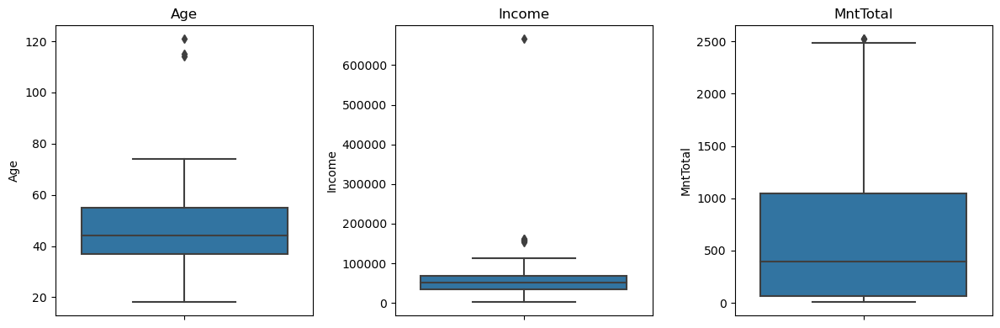

In [40]:
# visualização gráfica dos outliers das colunas 'Age', 'Income' e 'MntTotal'
search_outliers = ["Age", "Income", "MntTotal"]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), tight_layout=True)

for i, column in enumerate(search_outliers):
    sns.boxplot(y=df[column], ax=axs[i])
    axs[i].set_title(column)

# Exibindo os gráficos
plt.show()

In [41]:
df["Age"].describe()

count    2216.000000
mean       45.179603
std        11.985554
min        18.000000
25%        37.000000
50%        44.000000
75%        55.000000
max       121.000000
Name: Age, dtype: float64

In [42]:
# analisando outliers inferiores ou superiores da coluna 'Age'

df[(df["Age"] < (37 - 1.5 * (55 - 37))) | (df["Age"] > (55 + 1.5 * (55 - 37)))]

# aqui existem apenas outliers superiores

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,YearsSinceEnrolled,Age,AgeGroup,MntTotal,MntRegularProds,Children,HasChildren,AcceptedCmpTotal,HasAcceptedCmp,NumTotalPurchases
192,7829,1900,2n Cycle,Single,36640.0,1,0,2013-09-26,99,15,...,0,114,61+,65,40,1,1,0,0,5
239,11004,1893,2n Cycle,Single,60182.0,0,1,2014-05-17,23,8,...,0,121,61+,22,20,1,1,0,0,3
339,1150,1899,PhD,Partner,83532.0,0,0,2013-09-26,36,755,...,0,115,61+,1853,1629,0,0,1,1,14


In [43]:
# função auxiliar para erificação de outliers
from auxiliary_functions import inspect_outliers

inspect_outliers(df, "Age")

ModuleNotFoundError: No module named 'auxiliary_functions'

In [ ]:
# retirando os outliers da coluna 'Age'

df = df.drop(inspect_outliers(df, "Age").index)
df.info()

In [ ]:
df.Age.describe()

In [ ]:
# verificando outliers da coluna 'Income'
inspect_outliers(df, "Income")

In [ ]:
# retirando outliers da coluna 'Income'
df = df.drop(inspect_outliers(df, "Income").index)
df.info()

In [ ]:
df["Income"].describe()


In [ ]:
# verificando outliers da coluna 'MntTotal'

inspect_outliers(df, "MntTotal")

In [ ]:
# retirando outliers da coluna 'MntTotal'
df = df.drop(inspect_outliers(df, "MntTotal").index)
df.info()

In [ ]:
# visualização gráfica dos outliers das colunas 'Age', 'Income' e 'MntTotal'
search_outliers = ["Age", "Income", "MntTotal"]

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), tight_layout=True)

for i, column in enumerate(search_outliers):
    sns.boxplot(y=df[column], ax=axs[i])
    axs[i].set_title(column)

# Exibindo os gráficos
plt.show()

Agora podemos observar que não há mais presença de outliers

###### Iremos retirar algumas colunas 
- 'Z_CostContact' e 'Z_Revenue' não parecem ser relevantes e não temos informações sobre o que significam
- Já aas colunas 'ID', 'Year_Birth' e 'Dt_Customer' foram divididas ou trabalhadas de maneira a facilitar o uso de algoritmos e não se fazem mais necessárias

In [ ]:
df = df.drop(
    [
        'ID',
        'Year_Birth',
        'Dt_Customer',
        'Z_CostContact',
        'Z_Revenue'
        
    ], axis = 1
)


df.info()

In [ ]:
# salvando a base com os tratamentos realizados até agora
df.to_csv('Customers_treated.csv', index=False)

In [ ]:
# visualizando as características da base
with pd.option_context (
    'display.float_format','{:.2f}'.format,
    'display.max_columns', None,
):
    display(df.describe())

In [ ]:
# visualizando as colunas categóricas
df.describe(exclude='number')

In [ ]:
# escolhendo as colunas a serem analisadas
analysis =[
    'Income',
    'Recency',
    'DaysSinceEnrolled',
    'Age',
    'MntTotal',
    'HasChildren', 
    'Marital_Status'
]

In [ ]:
# realizaremos o pairplot para visualizar possíveis relações

sns.pairplot(
    df[analysis],
    diag_kind='kde',
    hue='HasChildren',
    plot_kws=dict(alpha=0.5),
    corner=True
   
);

In [ ]:
sns.pairplot(
    df[analysis],
    diag_kind='kde',
    hue= 'Marital_Status',
    plot_kws=dict(alpha=0.5),
    corner=True
   
)
plt.show();

In [ ]:
# iremos realizar boxplots para verificar possíveis outliers
# Renda e Educação
sns.boxplot(x="Education", y="Income", data=df, showmeans=True);


In [ ]:
sns.boxplot(x="Education", y="Income", data=df, showmeans=True, hue="HasChildren");


In [ ]:
sns.boxplot(x="Education", y="Income", data=df, showmeans=True, hue="Marital_Status");


In [ ]:
# HasAcceptedCmp
sns.boxplot(x="Education", y="Income", data=df, showmeans=True, hue="HasAcceptedCmp");

In [ ]:
#Response
sns.boxplot(x="Education", y="Income", data=df, showmeans=True, hue="Response");


In [ ]:
#Education X mntRegularProds
sns.boxplot(x="Education", y="MntRegularProds", data=df, showmeans=True);


In [ ]:
# Education X MntGoldProds
sns.boxplot(x="Education", y="MntGoldProds", data=df, showmeans=True);

In [ ]:
# AgeGroup X Income
sns.boxplot(x="AgeGroup", y="Income", data=df, showmeans=True)


Utilizaremos o get_dummies do Panda para transformação de colunas categóricas em colunas indicadoras para facilitar o uso de algoritmos, tendo em vista que a grande maioria deles necessita de variáveis categóricas para funcionar

In [ ]:
df_dummies = pd.get_dummies(df)
df_dummies.head()

In [ ]:
df_dummies.info()

In [ ]:
# salvando essa base
df_dummies.to_csv('customers_dummies.csv', index=False)


In [ ]:
# realizando a correlação

df_dummies_corr = df_dummies.corr()
df_dummies_corr

In [ ]:
# visualização gráfica
fig, ax = plt.subplots(figsize=(20, 20))

sns.heatmap(df_dummies_corr, annot=False, ax=ax, fmt=".1f", cmap="coolwarm_r");


In [ ]:
df_dummies_corr.head()


In [ ]:
df_dummies_corr_unstack = pd.DataFrame(df_dummies_corr.unstack())
df_dummies_corr_unstack = df_dummies_corr_unstack.rename(columns={0: "corr"})
df_dummies_corr_unstack.head(30)


In [ ]:
response_corr = df_dummies_corr_unstack.loc["Response"].sort_values(by="corr")[:-1]
response_corr

In [ ]:
fig, ax = plt.subplots(figsize=(16, 6))

b = sns.barplot(x=response_corr.index, y=response_corr["corr"], palette="coolwarm_r")

b.tick_params(axis="x", rotation=90)

plt.show()

In [ ]:
cmap = "coolwarm_r"
cnorm = CenteredNorm(vcenter=0, halfrange=0.4)
smap = ScalarMappable(norm=cnorm, cmap=cmap)

listed_colors = ListedColormap([smap.to_rgba(x) for x in response_corr["corr"]]).colors

In [ ]:
fig, ax = plt.subplots(figsize=(16, 6))

b = sns.barplot(x=response_corr.index, y=response_corr["corr"], palette=listed_colors)
b.tick_params(axis="x", rotation=90)
plt.show()

##### Pré-processamento

###### Iremos realizar uma clusterização, ou seja, iremos agrupar os dados que possuírem características semelhantes
- Assim poderemos visualizar padrões

In [ ]:
# colocando as variáveis numéricas em uma variável
numerical_features = df.select_dtypes(include="number").columns


In [ ]:
display(numerical_features)
len(numerical_features)

In [ ]:
fig, axs = plt.subplots(nrows=6,ncols=6, figsize=(14,14),tight_layout=True)

for ax, feature in zip(axs.flatten(),numerical_features):
    sns.histplot(x=feature, ax = ax, data= df)
    
plt.show()
#zip junta as coisas e o flatten vai retirar os ; para não pegar apenas o primeiro valor do array

###### Após visualizar a distribuição das features, iremos iniciar a etapa de tratamento

In [ ]:
# separando as colunas de acordo com cada tratamento
one_hot_cols = ['Education','Marital_Status','AgeGroup','HasChildren','HasAcceptedCmp',
               'AcceptedCmp1','AcceptedCmp2','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5',
               'Complain','Response','Kidhome','Teenhome','YearsSinceEnrolled','Children','AcceptedCmpTotal',]

# standard scaler
standard_cols = ['Income', 'Age']

#power transform
power_cols = df.columns[df.columns.str.startswith('Mnt')| df.columns.str.startswith('Num')].tolist()

#min max scaler
minmax_cols = [
col for col in df.columns if col not in one_hot_cols + standard_cols + power_cols
]

In [ ]:
preprocessing = ColumnTransformer(
[
    ('one_hot', OneHotEncoder(), one_hot_cols),
    ('standard', StandardScaler(), standard_cols),
    ('minmax', MinMaxScaler(), minmax_cols),
    ('power', PowerTransformer(), power_cols),
])
preprocessing.fit_transform(df)

In [ ]:
preprocessing.get_feature_names_out()

In [ ]:
df_scaled = pd.DataFrame(
    preprocessing.fit_transform(df),
    columns=preprocessing.get_feature_names_out()
)

df_scaled.head()


In [ ]:
scaled_columns_not_one_hot = df_scaled.columns[~df_scaled.columns.str.startswith("one")]
scaled_columns_not_one_hot


In [ ]:
len(scaled_columns_not_one_hot)

##### Iremos verificar graficamente as mudanças ocorridas após as etapas de pré processamento

In [ ]:
fig, axs = plt.subplots(nrows=5, ncols=4, figsize=(14, 14), tight_layout=True)

for ax, feature in zip(axs.flatten(), scaled_columns_not_one_hot):
    sns.histplot(x=feature, ax=ax, data=df_scaled)

plt.show()

##### Próxima etapa - definir o melhor número de clusters
- Para isso, iremos visualizar graficamente os métodos elbow e silhouette


In [ ]:
# utilizando o conjunto de dados
df_scaled, _ = make_blobs(n_samples=300, centers=4, random_state=42)

# armazenando valores de inércia em uma lista
inertia_values = []

# testando diferentes valores de K
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    inertia_values.append(kmeans.inertia_)

# gerando o gráfico
plt.plot(range(1, 11), inertia_values, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.show()

###### A ideia principal do Elbow Method é observar como a inércia (soma dos quadrados das distâncias dos pontos ao centro do cluster) varia em relação ao número de clusters.

In [ ]:
# Utilizando o conjunto de dados
df_scaled, _ = make_blobs(n_samples=300, centers=4, random_state=42)

# Lista para armazenar as pontuações de silhueta
silhouette_scores = []

# testando diferentes valores de K
for k in range(2, 11): 
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    labels = kmeans.labels_
    silhouette_avg = silhouette_score(df_scaled, labels)
    silhouette_scores.append(silhouette_avg)

# gerando o gráfico
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Method')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Average Silhouette Score')
plt.show()

###### A pontuação de silhueta varia de -1 a 1.
- Próximo de +1: O objeto está bem dentro de seu próprio cluster.
- Próximo de 0: O objeto está próximo ou no limite entre dois clusters.
- Próximo de -1: O objeto pode ter sido atribuído ao cluster errado.

###### A partir da análise dos Métodos Elbow e Silhouette, conseguimos observar os possíveis melhores valores de cluster e decidimos utilizar o número de clusters = 3

In [ ]:
# criação e treinamento do pipeline
pipeline = Pipeline(
    [
        ("preprocessing", preprocessing),
        ('pca', PCA(n_components=2, random_state=42) ),
        ("clustering", KMeans(n_clusters=3, random_state=42, n_init=10))
    ]
)

pipeline.fit(df)


#### Será realizada um etapa de PCA (Principal Component Analysis), que é uma técnica de redução de dimensionalidade com o objetivo de transformar um conjunto de variáveis correlacionadas em variáveis não correlaciondas na qual pode ocorrer perda de informações, porém de modo a manter as mais importantes e descartar as de menor importância mas faz-se necessário testar e verificar se obteve um bom funcionamento no conjunto de dados.

In [ ]:
pipeline.get_feature_names_out()


In [ ]:
pipeline.named_steps

In [ ]:
pipeline["clustering"].labels_

In [ ]:
#criando uma cópia, criando coluna 'cluster' e visualizando o cabeçalho
df_clustered = df.copy()
df_clustered["cluster"] = pipeline["clustering"].labels_

df_clustered.head()

In [ ]:
#verificando o agrupamento
df_clustered["cluster"].value_counts().sort_index()

In [ ]:
# selecionando colunas de interesse
columns_analysis = [
    "Income",
    "Recency",
    "DaysSinceEnrolled",
    "Age",
    "MntTotal",
]

#plotando o gráfico
sns.pairplot(
    df_clustered,
    vars=columns_analysis,
    diag_kind='kde',
    hue='cluster',
    plot_kws=dict(alpha=0.5),
    corner=True,
    palette='tab10', #melhorando a visualização dos clusters
)
plt.show()

Por esse e outros gráficos que iremos plotar, será possível visualizar as características de cada cluster
- cluster 2: pessoas com renda baixa e que compram menos

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(15, 5), tight_layout=True)

for ax, col in zip(axs, columns_analysis):
    sns.boxplot(x="cluster", y=col, data=df_clustered, ax=ax, showmeans=True)

Cluster 0: maior renda, maior número de compras

In [ ]:
# utilizando outras colunas para verificar as características
columns = [
    "HasChildren",
    "Marital_Status",
    "Education",
    "HasAcceptedCmp",
    "Response",
    "YearsSinceEnrolled",
]

cluster_diff_cols = ["MntTotal", "Income"]

In [ ]:
#MntTotal - Total Gasto
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 8), tight_layout=True)

for ax, col in zip(axs.flatten(), columns):
    sns.boxplot(
        x="cluster",
        y=cluster_diff_cols[0],
        data=df_clustered,
        ax=ax,
        showmeans=True,
        hue=col,
    )

In [ ]:
# Income - Renda
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 8), tight_layout=True)

for ax, col in zip(axs.flatten(), columns):
    sns.boxplot(
        x="cluster",
        y=cluster_diff_cols[1],
        data=df_clustered,
        ax=ax,
        showmeans=True,
        hue=col,
    )

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,8),sharey=True)

for ax, col in zip(axs.flatten(),columns):
    h = sns.histplot(x = 'cluster', hue=col, data= df_clustered, ax=ax, 
                 multiple='fill',stat='percent', discrete=True,
                shrink=0.8)
    # adaptável caso queira testar outros valores de n_cluster
    n_clusters = df_clustered['cluster'].nunique()
    # arrumando o eixo x
    h.set_xticks(range(n_clusters))
    # colocando a porcentagem no eixo y
    h.yaxis.set_major_formatter(PercentFormatter(1))
    h.set_ylabel("")
    
    for bars in h.containers:
        h.bar_label(bars, label_type='center', labels=[f'{b.get_height():.1%}' for b in bars],
                color='white', weight='bold', fontsize=12)

    for bar in h.patches:
        bar.set_linewidth(0)
    
# ajustando os espaços entre os gráficos
plt.subplots_adjust(hspace=0.3, wspace=0.3)

plt.show()

- Podemos observar na feature HasChildren que quanto ao cluster 0 há uma grande probabilidade de que não haja filhos, enquanto o cluster 1, claramento possui pelo menos um filho.
- cluster 0 também parece ter uma propensão maior a aceitação de campanhas enquanto o cluster 2, não tende a aceitar


In [ ]:
#melhorando o gráfico anterior
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15,8),sharey=True)

for ax, col in zip(axs.flatten(),columns):
    h = sns.histplot(x = col, hue='cluster', data= df_clustered, ax=ax, 
                 multiple='fill',stat='percent', discrete=True,
                shrink=0.8, palette='tab10')
    # verificando se a coluna é numérica ou texto
    if df_clustered[col].dtype != 'object':
        h.set_xticks(range(df_clustered[col].nunique()))
    
    # arrumando o eixo x
    h.set_xticks(range(n_clusters))
    # colocando a porcentagem no eixo y
    h.yaxis.set_major_formatter(PercentFormatter(1))
    h.set_ylabel("")
    
    for bars in h.containers:
        h.bar_label(bars, label_type='center', labels=[f'{b.get_height():.1%}' for b in bars],
                color='white', weight='bold', fontsize=12)

    for bar in h.patches:
        bar.set_linewidth(0)
    
    #removendo a legenda de cada gráfico
    legend = h.get_legend()
    legend.remove()
    
#ajustando a legenda para a figura
labels = [text.get_text() for text in legend.get_texts()]

fig.legend(handles = legend.legend_handles, labels= labels,
           loc = 'upper center', ncols=3, title= 'Clusters')
# ajustando os espaços entre os gráficos
plt.subplots_adjust(hspace=0.3, wspace=0.3)

plt.show()

In [ ]:
#verificando a distribuição de AgeGroup
df_clustered['AgeGroup'].value_counts()

In [ ]:
# Filtrando apenas para a variável 'AgeGroup'
df_clustered_age = df_clustered[['AgeGroup', 'cluster']]

fig, ax = plt.subplots(figsize=(10, 6))

h = sns.histplot(x='AgeGroup', hue='cluster', data=df_clustered_age, ax=ax, 
                 multiple='fill', stat='percent', discrete=True,
                 shrink=0.8, palette='tab10')

ax.set_xticks(range(df_clustered_age['AgeGroup'].nunique()))

# Colocando a porcentagem no eixo y
ax.yaxis.set_major_formatter(PercentFormatter(1))
ax.set_ylabel("")

for bars in h.containers:
    h.bar_label(bars, label_type='center', labels=[f'{b.get_height():.1%}' for b in bars],
                color='white', weight='bold', fontsize=12)

for bar in h.patches:
    bar.set_linewidth(0)

legend = h.get_legend()
legend.remove()

fig.legend(handles=legend.legend_handles, labels=['Cluster 0', 'Cluster 1', 'Cluster 2'],
           loc='upper center', title='Clusters', ncols=3)

plt.show()


Resumo geral das análises de clusters::

-Cluster 0:

    -renda alta
    -gasto alto
    -muito provalmente não tem filhos
    -mais propenso a aceitar campanhas
    -cluster sem pessoas com escolaridade básica
    -sem um perfil de idade que se destaque

-Cluster 1:

    -renda intermediária
    -gasto intermediário
    -provalmente tem filhos
    -pode aceitar campanhas
    -pessoas com idade mais elevada

-Cluster 2:

    -renda baixa
    -gasto baixo
    -provalmente tem filhos
    -baixa propensão a aceitar campanhas
    -único cluster com porcentagem significativa de pessoas com escolaridade básica (>96%)
    -pessoas mais jovens


In [ ]:
pipeline

In [ ]:
# selecionando todas as etapas menos a última etapa do pipeline
pipeline[:-1]

In [ ]:
pipeline[:-1].get_feature_names_out()

In [ ]:
df_pca = pd.DataFrame(
    pipeline[:-1].fit_transform(df),
    columns=pipeline[:-1].get_feature_names_out()
)

df_pca.head()


In [ ]:
centroids = pipeline['clustering'].cluster_centers_
centroids

##### Criação de modelo de classificação


In [ ]:
df_clustered.info()

In [ ]:
# definindo x e y 
X = df_clustered.drop("Response", axis=1)
y = df_clustered["Response"]

In [ ]:
X.head()

In [ ]:
y.head()

Vamos realizar os mesmos tratamentos feitos nas etapas anteriores, porém iremos retirar a coluna 'Response'e adicionar a coluna 'cluster'e o tratamento será feito em X.

In [ ]:
#tratamento das colunas

one_hot_cols = [
    "Education",
    "Marital_Status",
    "AgeGroup",
    "HasChildren",
    "HasAcceptedCmp",
    "AcceptedCmp1",
    "AcceptedCmp2",
    "AcceptedCmp3",
    "AcceptedCmp4",
    "AcceptedCmp5",
    "Complain",
    "Kidhome",
    "Teenhome",
    "YearsSinceEnrolled",
    "Children",
    "AcceptedCmpTotal",
    "cluster"
]

standard_cols = [
    "Income",
    "Age",
]

power_cols = X.columns[
   X.columns.str.startswith("Mnt") | X.columns.str.startswith("Num")
].tolist()

minmax_cols = [
    col for col in X.columns if col not in one_hot_cols + standard_cols + power_cols
]

DummyClassifier será utilizado para ver se os modelos realmente performaram bem
- referência
- utiliza o label mais frequente

Utilizaremos modelos que sejam mais facéis de explicar, como pedido no case

In [ ]:
#criando os modelos
models = {
    "DummyClassifier": DummyClassifier(
        strategy="stratified", random_state=42),
    "DecisionTreeClassifier": DecisionTreeClassifier(random_state=42),
    "LogisticRegression": LogisticRegression(random_state=42),
    "KNNClassifier": KNeighborsClassifier(n_neighbors=5),
}

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)


def pipeline_model(X, y, model, kf):
    preprocessing = ColumnTransformer(
        [
            ("one-hot", OneHotEncoder(), one_hot_cols),
            ("standard", StandardScaler(), standard_cols),
            ("minmax", MinMaxScaler(), minmax_cols),
            ("power", PowerTransformer(), power_cols),
        ]
    )

    pipeline = Pipeline(
        [
            ("preprocessing", preprocessing),
            ("feature_selection", SelectKBest(score_func=f_classif, k=10)),
            ("rus", RandomUnderSampler(random_state=42)),
            ("model", model),
        ]
    )

    #validação cruzada
    scores = cross_validate(
        pipeline,
        X,
        y,
        cv=kf,
        scoring=["accuracy", "precision", "recall", "roc_auc", "average_precision"],
        n_jobs=-1,
    )

    return scores

In [ ]:
results = {
    "DummyClassifier": pipeline_model(X, y, models["DummyClassifier"], skf),
    "DecisionTreeClassifier": pipeline_model(X, y, models["DecisionTreeClassifier"], skf),
    "LogisticRegression": pipeline_model(X, y, models["LogisticRegression"], skf),
    "KNNClassifier": pipeline_model(X, y, models["KNNClassifier"], skf),
}

In [ ]:
# utilizando o pprint para visualizar os resultados
pprint(results)

In [ ]:
# time
for k, v in results.items():
    results[k]["time"] = results[k]["fit_time"] + results[k]["score_time"]

pprint(results)

In [ ]:
# criando um dataframe com os resultados obtidos em cada algoritmo para facilitar a visualização
df_results = pd.DataFrame(results).T.reset_index().rename(columns={"index": "model"})
df_results

In [ ]:
df_results.columns[1:].to_list()

In [ ]:
df_results.columns[3:].to_list()

In [ ]:
# explode para  transformar uma coluna com listas em várias linhas
df_results_explode = df_results.explode(
    df_results.columns[1:].to_list()
).reset_index(drop=True)

df_results_explode

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 8), tight_layout=True)

cols = df_results.columns[3:].to_list()

for ax, col in zip(axs.flatten(), cols):
    b = sns.boxplot(x="model", y=col, data=df_results_explode, ax=ax, showmeans=True)
    # evitando a sobreposição no eixo x
    b.set_xticklabels(b.get_xticklabels(), fontsize=7)

plt.show()

- observando 'test_average_precision' - área sob a curva ROC
- O modelo que performou melhor foi a Regressão linear e por isso, iremos utilizá-la, apesar do tempo similar a KNN, é melhor em outros fatores


- Pudemos também observar o Dummy Classifier que serviu como referência para ecidenciar a real performance da RL
 - iremos agora melhorar os hiperparâmetros visando o melhor resultado

In [ ]:
# análise do modelo sem mudanças
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

preprocessing = ColumnTransformer(
    [
        ("one-hot", OneHotEncoder(), one_hot_cols),
        ("standard", StandardScaler(), standard_cols),
        ("minmax", MinMaxScaler(), minmax_cols),
        ("power", PowerTransformer(), power_cols),
    ]
)

pipeline_RL = Pipeline(
    [
        ("preprocessing", preprocessing),
        ("feature_selection", SelectKBest(score_func=f_classif, k=10)),
        ("rus", RandomUnderSampler(random_state=42)),
        ("model", LogisticRegression(random_state=42))
    ]
)

pipeline_RL.fit(X, y)

In [ ]:
# ROC
y_pred = cross_val_predict(pipeline_RL, X, y, cv=skf, n_jobs=-1)

roc = RocCurveDisplay.from_predictions(y, y_pred)

In [ ]:
# Precision-Recall
from sklearn.metrics import PrecisionRecallDisplay

y_pred = cross_val_predict(pipeline_RL, X, y, cv=skf, n_jobs=-1, method="decision_function")

prc = PrecisionRecallDisplay.from_predictions(y, y_pred)

##### GridSearchCV
- Para a busca dos melhores parâmetros, iremos utilizar o GridSearchCV que explora um conjunto pré definido de valores para cada hiperparâmetro
- treina e avalia o  modelo pra todas as combinações possíveis dos valores usando cross validate 
-  os melhores hiperparâmetros serão utilizados no modelo

In [ ]:
# verificando os parâmetros
param_grid = {
    "feature_selection__k": [10, 15, 20, 25],
    "model__C": np.logspace(-3, 3, 7),
    #lbfgs é padrão, sag costuma ser boa para datsets grandes
    "model__solver": ["liblinear", "lbfgs", "saga"],
    "model__penalty": ["l1", "l2", "elasticnet", "none"],
}

grid_search = GridSearchCV(
    pipeline_RL,
    param_grid,
    scoring=["roc_auc", "average_precision", "accuracy"],
    n_jobs=-1,
    #métrica mais adequada para dataset desbalanceado
    refit="average_precision"
)

In [ ]:
grid_search

In [ ]:
grid_search.fit(X, y)

#### warnings
- falam sobre as combinações que não foram possíveis de serem feitas e não indicam um erro e por isso, serão silenciados
- importante lembrar que não devem ser apenas silenciados sem antes entender o contexto

In [ ]:
# verificando os melhores parâmetros
grid_search.best_params_

In [ ]:
# verificando o melhor score considerando o average_precision
grid_search.best_score_

In [ ]:
# * unpack do dicionário
print(*grid_search.cv_results_.keys(), sep="\n")

In [ ]:
# verificando o melhor roc_auc
np.nanmax(grid_search.cv_results_["mean_test_roc_auc"])

In [ ]:
# verificando a melhor acurácia
np.nanmax(grid_search.cv_results_["mean_test_accuracy"])

Verificando os mehores parâmetros para cada métrica

In [ ]:
grid_search.cv_results_["params"][np.nanargmax(grid_search.cv_results_["mean_test_average_precision"])]

In [ ]:
grid_search.cv_results_["params"][np.nanargmax(grid_search.cv_results_["mean_test_roc_auc"])]

In [ ]:
grid_search.cv_results_["params"][np.nanargmax(grid_search.cv_results_["mean_test_accuracy"])]

In [ ]:
# colocando em um df
df_results_gs = pd.DataFrame(
    {
        "auprc": grid_search.cv_results_["mean_test_average_precision"],
        "auroc": grid_search.cv_results_["mean_test_roc_auc"],
        "accuracy": grid_search.cv_results_["mean_test_accuracy"],
    }
)

df_results_gs

In [ ]:
# visualizando graficamente
sns.boxplot(
    data=df_results_gs,
    showmeans=True
)

##### Iremos criar um Pipeline utilizando os melhores parâmetros

In [ ]:
pipeline_RL_best = Pipeline(
    [
        ("preprocessing", preprocessing),
        ("feature_selection", SelectKBest(score_func=f_classif, k=grid_search.best_params_["feature_selection__k"])),
        ("rus", RandomUnderSampler(random_state=42)),
        ("model", LogisticRegression(
            random_state=42,
            C=grid_search.best_params_["model__C"],
            penalty=grid_search.best_params_["model__penalty"],
            solver=grid_search.best_params_["model__solver"],
        ))
    ]
)

scores = cross_validate(
    pipeline_RL_best,
    X,
    y,
    cv=skf,
    scoring=["accuracy", "precision", "recall", "roc_auc", "average_precision"],
    n_jobs=-1
)

In [ ]:
#visualizando o pipeline
pipeline_RL_best

In [ ]:
scores

In [ ]:
scores['time'] = scores['fit_time'] + scores['score_time']
scores

In [ ]:
# melhorando a visualização com um dataframe
df_scores_best = pd.DataFrame(scores)
df_scores_best

In [ ]:
pipeline_RL_best.fit(X,y)

###### Iremos realizar os gráficos feitos anteriormente a escolha dos melhores parâmetro pelo GridSearchCV

In [ ]:
y_pred = cross_val_predict(pipeline_RL_best, X, y, cv=skf, n_jobs=-1)

roc = RocCurveDisplay.from_predictions(y, y_pred)

In [ ]:
# Precision-Recall

y_pred = cross_val_predict(pipeline_RL_best, X, y, cv=skf, n_jobs=-1, method="decision_function")

prc = PrecisionRecallDisplay.from_predictions(y, y_pred)

Em ambas as métrica pudemos observar melhora
- ROC_curve: anteriormente 0,71 e agora 0,78
- Precision Recall: anteriormente 0,42 e agora 0,58